In [171]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from scipy import stats
import numpy as np
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import plotly.express as px
#to test hetroscadasticity
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.diagnostic import het_white
from statsmodels.formula.api import ols
#to check multicolinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor



In [172]:
df = pd.read_csv('/Users/Suwani/Desktop/Semester 5/Data wrangling/Assignment/DW_Cleaning_1.csv')

In [173]:
df.head()

,Date,Hour,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Year,Month,Day,Day_name,Season
0,3/10/2004,18,2.6,1360.00,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,16.475,48.875001,0.757754,2004,3,10,Wednesday,SPRING
1,3/10/2004,19,2.0,1292.25,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,14.500,47.700000,0.725487,2004,3,10,Wednesday,SPRING
2,3/10/2004,20,2.2,1402.00,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,12.825,53.975000,0.750239,2004,3,10,Wednesday,SPRING
3,3/10/2004,21,2.2,1375.50,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.500,60.000000,0.786713,2004,3,10,Wednesday,SPRING
4,3/10/2004,22,1.6,1272.25,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,9.500,59.575001,0.788794,2004,3,10,Wednesday,SPRING


In [174]:
df.shape

(9357, 19)

In [175]:
#Normalizing the data and removing outliers
z = np.abs(stats.zscore( df[['CO(GT)','PT08.S1(CO)','C6H6(GT)','PT08.S2(NMHC)','NOx(GT)','PT08.S3(NOx)','NO2(GT)','PT08.S4(NO2)','PT08.S5(O3)','T','AH','RH']]))
df = df[(z < 3).all(axis=1)]

In [176]:
df.shape

(8871, 19)

In [177]:
df['Day_name'] = df['Day_name'].str.replace('Monday','WD')
df['Day_name'] = df['Day_name'].str.replace('Tuesday','WD')
df['Day_name'] = df['Day_name'].str.replace('Wednesday','WD')
df['Day_name'] = df['Day_name'].str.replace('Thursday','WD')
df['Day_name'] = df['Day_name'].str.replace('Friday','WD')
df['Day_name'] = df['Day_name'].str.replace('Saturday','WE')
df['Day_name'] = df['Day_name'].str.replace('Sunday','WE')


In [178]:
#df.to_csv('/Users/Suwani/Desktop/Semester 5/Data wrangling/Assignment/DW_with_weekendday.csv')

In [179]:
df = pd.get_dummies(df, columns=['Season','Day_name'],drop_first = True)

In [180]:
df.shape

(8871, 21)

In [181]:
df.head()

,Date,Hour,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),...,T,RH,AH,Year,Month,Day,Season_SPRING,Season_SUMMER,Season_WINTER,Day_name_WE
0,3/10/2004,18,2.6,1360.00,11.881723,1045.50,166.0,1056.25,113.0,1692.00,...,16.475,48.875001,0.757754,2004,3,10,1,0,0,0
1,3/10/2004,19,2.0,1292.25,9.397165,954.75,103.0,1173.75,92.0,1558.75,...,14.500,47.700000,0.725487,2004,3,10,1,0,0,0
2,3/10/2004,20,2.2,1402.00,8.997817,939.25,131.0,1140.00,114.0,1554.50,...,12.825,53.975000,0.750239,2004,3,10,1,0,0,0
3,3/10/2004,21,2.2,1375.50,9.228796,948.25,172.0,1092.00,122.0,1583.75,...,11.500,60.000000,0.786713,2004,3,10,1,0,0,0
4,3/10/2004,22,1.6,1272.25,6.518224,835.50,131.0,1205.00,116.0,1490.00,...,9.500,59.575001,0.788794,2004,3,10,1,0,0,0


In [145]:
#df.to_csv('/Users/Suwani/Desktop/Semester 5/Data wrangling/Assignment/Air_wo_outliers_1.csv')

### Skewed Data

In [182]:
df.columns

Index(['Date', 'Hour', 'CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)',
       'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
       'T', 'RH', 'AH', 'Year', 'Month', 'Day', 'Season_SPRING',
       'Season_SUMMER', 'Season_WINTER', 'Day_name_WE'],
      dtype='object')

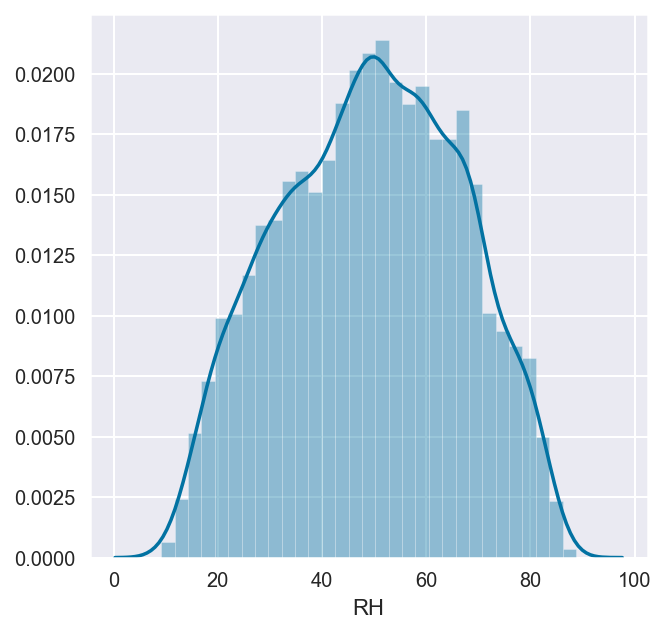

In [183]:
#https://towardsdatascience.com/top-3-methods-for-handling-skewed-data-1334e0debf45

plt.figure(figsize = (5,5))
ax = sns.distplot((df['RH']))
plt.show()


#plt.figure(figsize = (5,5))
#ax = sns.distplot(np.log(df['RH']))
#plt.show()

#plt.figure(figsize = (5,5))
#ax = sns.distplot(np.sqrt(df['RH']))
#plt.show()

In [218]:
#Getting score for skewness
print('Without transformation: ',(df['RH']).skew())
print( 'log transformation: ',np.log(df['RH']).skew())
print( 'square root transformation: ',np.sqrt(df['RH']).skew())

Without transformation:  -0.06935654801506042
log transformation:  -0.86063582369074
square root transformation:  -0.4315670593406789


###### according to above results, RH is approximatly normally distributed and no need of doing a log or a squar root transformation

In [189]:
#all the variables
Y_1=df['RH']
X_1=df[['CO(GT)','PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'AH','Season_SPRING','Season_SUMMER','Season_WINTER','Day_name_WE']]
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1, Y_1, test_size = 0.3, random_state = 1)

print('Training Data Count: {}'.format(X_train.shape[0]))
print('Testing Data Count: {}'.format(X_test.shape[0]))

X_train = sm.add_constant(X_train_1)
results_1 = sm.OLS(y_train_1, X_train_1).fit()
results_1.summary()


Training Data Count: 6209
Testing Data Count: 2662


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     RH   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                     8800.
Date:                Fri, 21 Feb 2020   Prob (F-statistic):               0.00
Time:                        21:01:36   Log-Likelihood:                -23742.
No. Observations:                6209   AIC:                         4.751e+04
Df Residuals:                    6194   BIC:                         4.761e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
CO(GT)           -0.7543      0.251     -3.002      0.003      -1.247      -0.262
PT08.S1(CO)       0.0251      0.002     11.310      0.000       0.021       0.029
C6H6(GT)         -2.2193      0.109    -20.272      0.000      -2.434      -2.005
PT08.S2(NMHC)    -0.0433      0.003    -13.847      0.000      -0.049      -0.037
NOx(GT)           0.0443      0.002     23.471      0.000       0.041       0.048
PT08.S3(NOx)      0.0011      0.001      1.170      0.242      -0.001       0.003
NO2(GT)          -0.0946      0.007    -14.515      0.000      -0.107      -0.082
PT08.S4(NO2)      0.0455      0.002     23.330      0.000       0.042       0.049
PT08.S5(O3)       0.0191      0.001     18.901      0.000       0.017       0.021
T                -0.7263      0.028    -26.137      0.000      -0.781      -0.672
AH                6.7942      0.988      6.878      0.000       4.858       8.731
Season_SPRING     2.5316      0.648      3.909      0.000       1.262       3.801
Season_SUMMER    -5.7700      0.720     -8.010      0.000      -7.182      -4.358
Season_WINTER    14.4959      0.584     24.819      0.000      13.351      15.641
Day_name_WE      -2.3243      0.329     -7.073      0.000      -2.968      -1.680
==============================================================================
Omnibus:                       73.795   Durbin-Watson:                   2.018
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              121.157
Skew:                           0.081   Prob(JB):                     4.91e-27
Kurtosis:                       3.665   Cond. No.                     1.99e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.99e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [190]:
#without 'PT08.S3(NOx)'
Y_2=df['RH']
X_2=df[['CO(GT)','PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
        'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'AH','Season_SPRING','Season_SUMMER','Season_WINTER','Day_name_WE']]
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, Y_2, test_size = 0.3, random_state = 1)

print('Training Data Count: {}'.format(X_train.shape[0]))
print('Testing Data Count: {}'.format(X_test.shape[0]))

X_train = sm.add_constant(X_train_2)
results_2 = sm.OLS(y_train_2, X_train_2).fit()
results_2.summary()

Training Data Count: 6209
Testing Data Count: 2662


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     RH   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                     9428.
Date:                Fri, 21 Feb 2020   Prob (F-statistic):               0.00
Time:                        21:01:48   Log-Likelihood:                -23742.
No. Observations:                6209   AIC:                         4.751e+04
Df Residuals:                    6195   BIC:                         4.761e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
CO(GT)           -0.7739      0.251     -3.087      0.002      -1.265      -0.282
PT08.S1(CO)       0.0256      0.002     11.774      0.000       0.021       0.030
C6H6(GT)         -2.3092      0.078    -29.588      0.000      -2.462      -2.156
PT08.S2(NMHC)    -0.0425      0.003    -13.915      0.000      -0.049      -0.037
NOx(GT)           0.0446      0.002     23.852      0.000       0.041       0.048
NO2(GT)          -0.0956      0.006    -14.806      0.000      -0.108      -0.083
PT08.S4(NO2)      0.0467      0.002     27.982      0.000       0.043       0.050
PT08.S5(O3)       0.0187      0.001     19.677      0.000       0.017       0.021
T                -0.7281      0.028    -26.243      0.000      -0.783      -0.674
AH                6.2038      0.849      7.304      0.000       4.539       7.869
Season_SPRING     2.3801      0.635      3.750      0.000       1.136       3.624
Season_SUMMER    -5.8365      0.718     -8.127      0.000      -7.244      -4.429
Season_WINTER    14.4863      0.584     24.804      0.000      13.341      15.631
Day_name_WE      -2.3520      0.328     -7.176      0.000      -2.995      -1.710
==============================================================================
Omnibus:                       74.168   Durbin-Watson:                   2.018
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              123.139
Skew:                           0.076   Prob(JB):                     1.82e-27
Kurtosis:                       3.673   Cond. No.                     1.73e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.73e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [193]:
#importing the model significant dataset
df_sig = df[['CO(GT)','PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
        'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'AH','Season_SPRING','Season_SUMMER','Season_WINTER','Day_name_WE','RH']]
df_sig.to_csv('/Users/Suwani/Desktop/Semester 5/Data wrangling/Assignment/model_significant.csv')

### Assumption Testing

#### 1. Linearity of the model

In [128]:
fig = px.scatter(df, x='CO(GT)', y="RH", trendline="ols")
fig.show()

/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



In [76]:
fig = px.scatter(df, x='PT08.S1(CO)', y="RH", trendline="ols")
fig.show()

/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



In [75]:
fig = px.scatter(df, x='C6H6(GT)', y="RH", trendline="ols")
fig.show()

/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



In [74]:
fig = px.scatter(df, x='PT08.S2(NMHC)', y="RH", trendline="ols")
fig.show()

fig = px.scatter(df, x='NOx(GT)', y="RH", trendline="ols")
fig.show()

fig = px.scatter(df, x='PT08.S3(NOx)', y="RH", trendline="ols")
fig.show()

fig = px.scatter(df, x='NO2(GT)', y="RH", trendline="ols")
fig.show()

fig = px.scatter(df, x='PT08.S4(NO2)', y="RH", trendline="ols")
fig.show()

fig = px.scatter(df, x='PT08.S4(NO2)', y="RH", trendline="ols")
fig.show()

fig = px.scatter(df, x='PT08.S5(O3)', y="RH", trendline="ols")
fig.show()

fig = px.scatter(df, x='T', y="RH", trendline="ols")
fig.show()

fig = px.scatter(df, x='AH', y="RH", trendline="ols")
fig.show()




/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



##### Expectation (mean) of residuals is zero

In [208]:
results_2.resid.mean()

0.10129998630354323

This is approximatly zero. Hence, we can conclude that expectation of residuals is indeed 0.

#### 2.Checking multicolinearity

In [191]:
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_2.values, i) for i in range(X_2.shape[1])]
vif["features"] = X.columns

In [192]:
vif.round(1)

,VIF Factor,features
0,17.4,CO(GT)
1,295.4,PT08.S1(CO)
2,41.0,C6H6(GT)
3,433.3,PT08.S2(NMHC)
4,13.5,NOx(GT)
5,28.1,NO2(GT)
6,311.6,PT08.S4(NO2)
7,52.2,PT08.S5(O3)
8,9.7,T
9,45.2,AH


In most of the variables VIF is higher than 10. Hence, the variables are highly correlated with each other. 
A possible solution is to use PCA to reduce features to a smaller set of uncorrelated components.

#### 3. Homoscedasticity

In [201]:
df_h = pd.read_csv('/Users/Suwani/Desktop/Semester 5/Data wrangling/Assignment/model_significant.csv')

In [202]:
df_h.columns

Index(['CO_GT', 'PT08_S1_CO', 'C6H6_GT', 'PT08_S2_NMHC', 'NOX_GT', 'NO2_GT',
       'PT08_S4_NO2', 'PT08_S5_O3', 'T', 'AH', 'Season_SPRING',
       'Season_SUMMER', 'Season_WINTER', 'Day_name_WE', 'RH'],
      dtype='object')

In [207]:
#https://medium.com/@remycanario17/tests-for-heteroskedasticity-in-python-208a0fdb04ab
f_h ='RH~CO_GT+PT08_S1_CO+C6H6_GT+PT08_S2_NMHC+NOX_GT+NO2_GT+PT08_S4_NO2+PT08_S5_O3+T+AH+Season_SPRING+Season_SUMMER+Season_WINTER+Day_name_WE'
RH_model = ols(formula=f_h, data=df_h).fit()
white_test = het_white(RH_model.resid,  RH_model.model.exog)

labels = ['LM Statistic', 'LM-Test p-value', 'F-Statistic', 'F-Test p-value']
print(dict(zip(labels, white_test)))

{'LM Statistic': 2551.3217221010414, 'LM-Test p-value': 0.0, 'F-Statistic': 31.856774726374482, 'F-Test p-value': 0.0}



H0: There is No Heteroscedasticity
H1: There is Heteroscedasticity

As P value is smaller than 0.05 we can not reject the null hypothesis and conclude that there is Heteroscedasticity.
Can use robust standard errors as a remedy

In [ ]:
#https://towardsdatascience.com/assumptions-of-linear-regression-algorithm-ed9ea32224e1

In [209]:
#from yellowbrick.regressor import ResidualsPlot
#from sklearn.linear_model import LinearRegression
#Lr = LinearRegression()
#vis = ResidualsPlot(Lr)
#vis.fit(X_train,y_train)
#y_pred = Lr.predict(X_test)
#vis.score(y_pred,y_test)
#vis.proof() 

#### 4. Normal distribution of error terms:

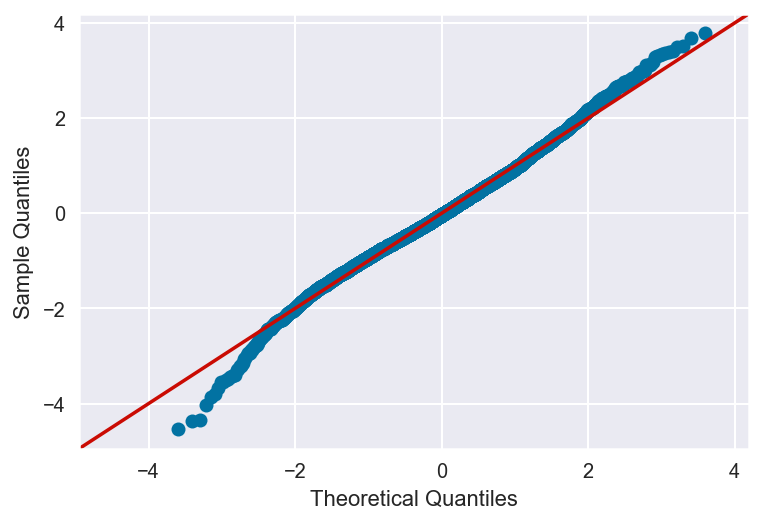

In [210]:
mod_fit = sm.OLS(y_train_2,X_train_2).fit()
res = mod_fit.resid #residuals()
fig = sm.qqplot(res, fit = True, line = '45')
plt.show()
#according to the below dataset errors are normally distributed

Multiple regression assumes that the residuals are normally distributed.
According to the below dataset errors are normally distributed as the plot shows fairly a straight line.

##### 5. Serial correlation of residuals

DW test value is 2.018
It is near to 2. Hence, we can conclude that there is only very little serial correlation.